In [ ]:
pip install yfinance

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
import datetime
import yfinance

In [ ]:
import yfinance as yfinance

In [ ]:
plt.rcParams['figure.figsize'] = [20, 10]
plt.rc('font', size=14)

In [ ]:
np.random.seed(0)

In [ ]:
y = np.arange(0,100,1) + np.random.normal(0,10,100)

In [ ]:
sma = pd.Series(y).rolling(20).mean()

In [ ]:
df = pd.read_csv('GOOD_STOCK.csv')

print(df.to_string())

length=len(df)

       Symbols
0     ADANIENT
1   ADANIPORTS
2   APOLLOHOSP
3   ASIANPAINT
4     AXISBANK
5   BAJAJ-AUTO
6   BAJAJFINSV
7   BAJFINANCE
8   BHARTIARTL
9         BPCL
10   BRITANNIA
11       CIPLA
12   COALINDIA
13    DIVISLAB
14     DRREDDY
15   EICHERMOT
16      GRASIM
17     HCLTECH
18        HDFC
19    HDFCBANK
20    HDFCLIFE
21  HEROMOTOCO
22    HINDALCO
23  HINDUNILVR
24   ICICIBANK
25  INDUSINDBK
26        INFY
27         ITC
28    JSWSTEEL
29   KOTAKBANK
30          LT
31         M&M
32      MARUTI
33   NESTLEIND
34        NTPC
35        ONGC
36   POWERGRID
37    RELIANCE
38     SBILIFE
39        SBIN
40   SUNPHARMA
41  TATACONSUM
42  TATAMOTORS
43   TATASTEEL
44         TCS
45       TECHM
46       TITAN
47  ULTRACEMCO
48         UPL
49       WIPRO


In [ ]:
name1 = df['Symbols']

In [ ]:
name = []
for x in name1:
  str1 = ".NS"

  str3= x+str1
  name.append(str3)

print(name)

['ADANIENT.NS', 'ADANIPORTS.NS', 'APOLLOHOSP.NS', 'ASIANPAINT.NS', 'AXISBANK.NS', 'BAJAJ-AUTO.NS', 'BAJAJFINSV.NS', 'BAJFINANCE.NS', 'BHARTIARTL.NS', 'BPCL.NS', 'BRITANNIA.NS', 'CIPLA.NS', 'COALINDIA.NS', 'DIVISLAB.NS', 'DRREDDY.NS', 'EICHERMOT.NS', 'GRASIM.NS', 'HCLTECH.NS', 'HDFC.NS', 'HDFCBANK.NS', 'HDFCLIFE.NS', 'HEROMOTOCO.NS', 'HINDALCO.NS', 'HINDUNILVR.NS', 'ICICIBANK.NS', 'INDUSINDBK.NS', 'INFY.NS', 'ITC.NS', 'JSWSTEEL.NS', 'KOTAKBANK.NS', 'LT.NS', 'M&M.NS', 'MARUTI.NS', 'NESTLEIND.NS', 'NTPC.NS', 'ONGC.NS', 'POWERGRID.NS', 'RELIANCE.NS', 'SBILIFE.NS', 'SBIN.NS', 'SUNPHARMA.NS', 'TATACONSUM.NS', 'TATAMOTORS.NS', 'TATASTEEL.NS', 'TCS.NS', 'TECHM.NS', 'TITAN.NS', 'ULTRACEMCO.NS', 'UPL.NS', 'WIPRO.NS']


In [ ]:
n_forward = 40

start_date = "2012-01-01"
end_date = "2023-05-23"


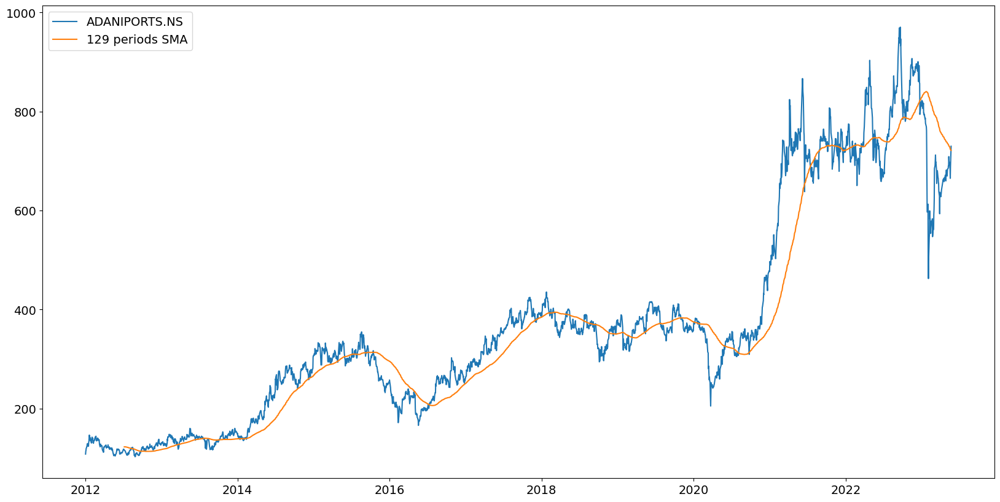

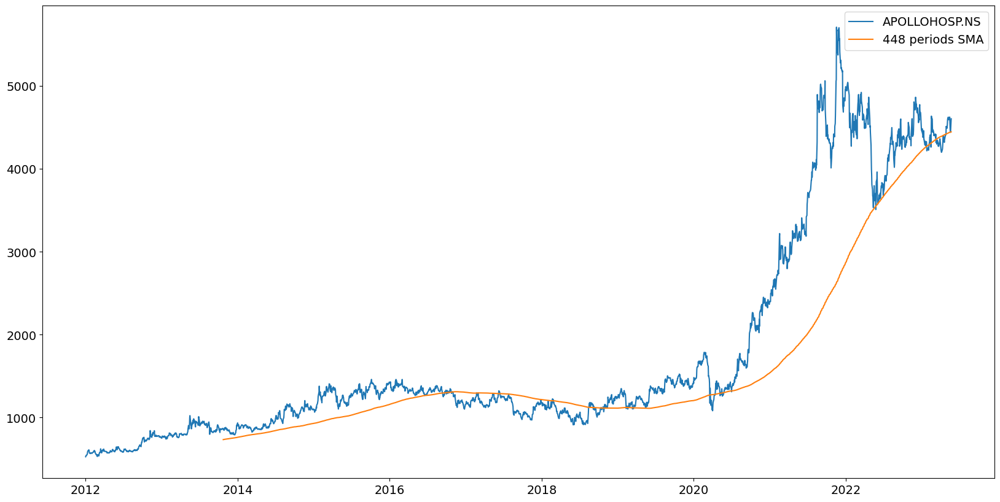

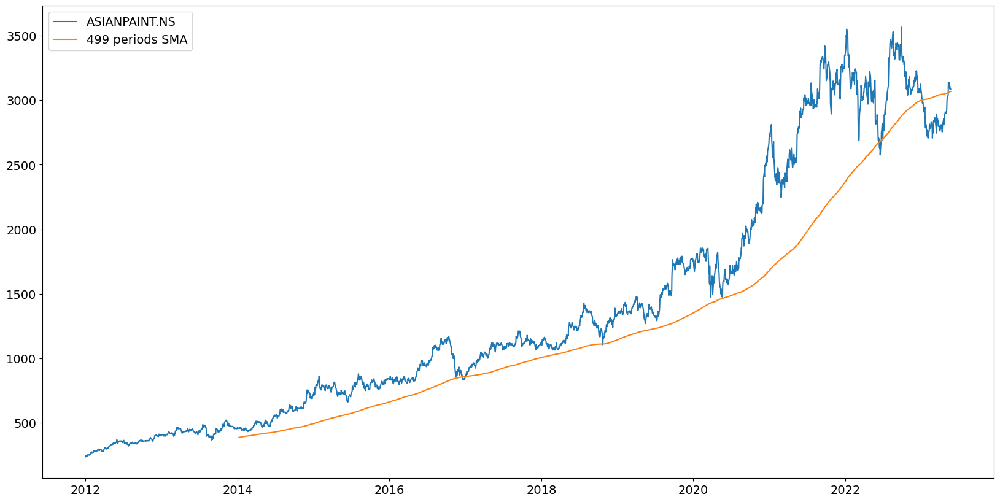

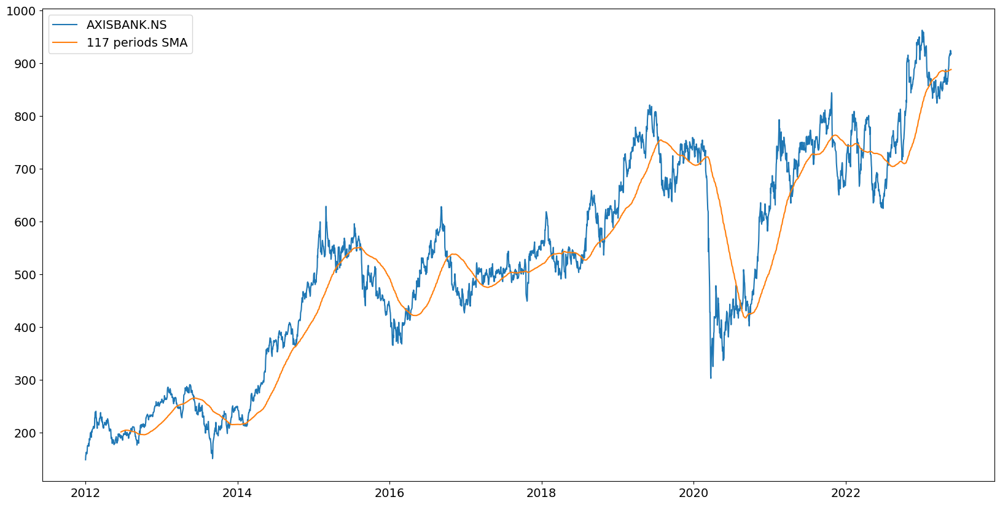

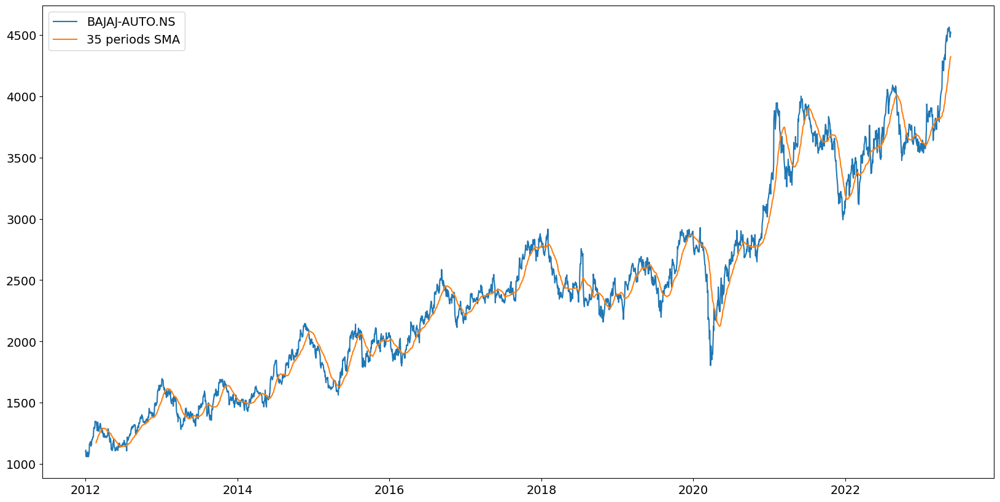

...

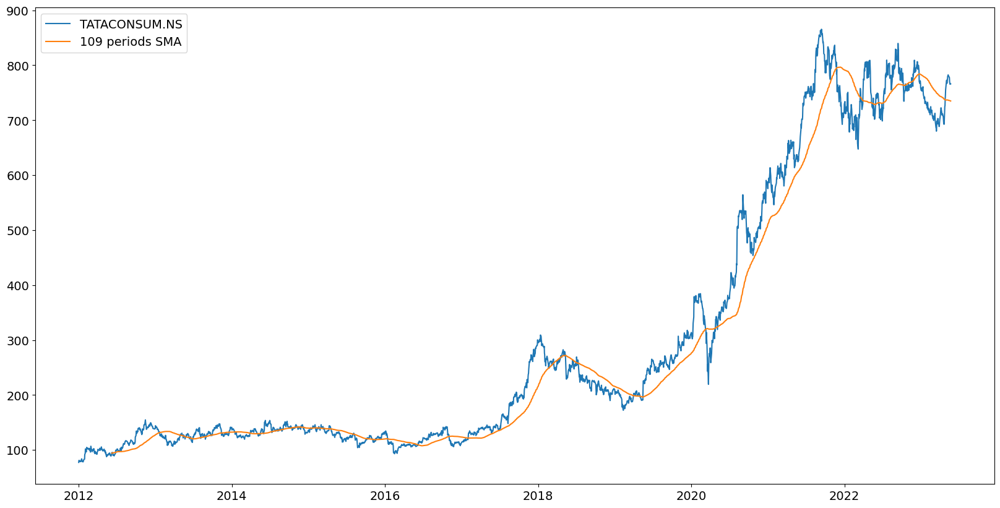

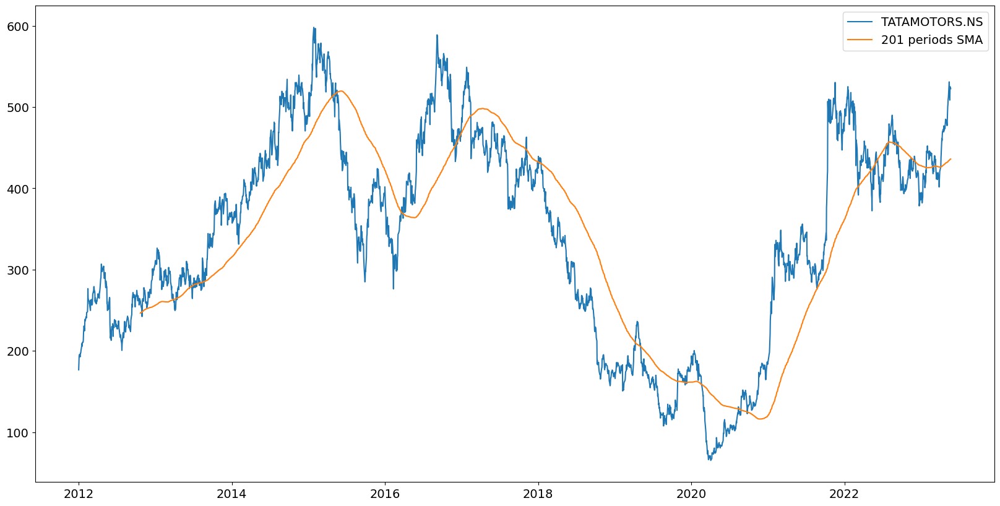

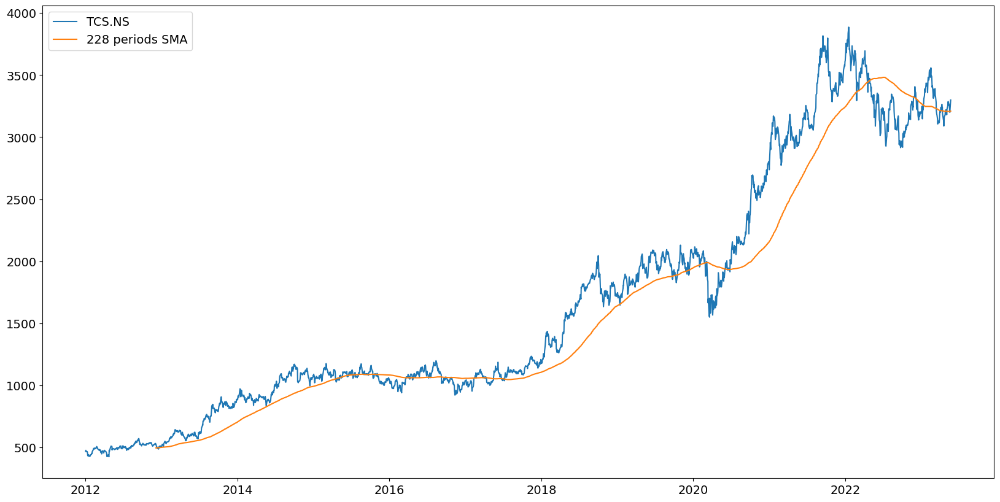

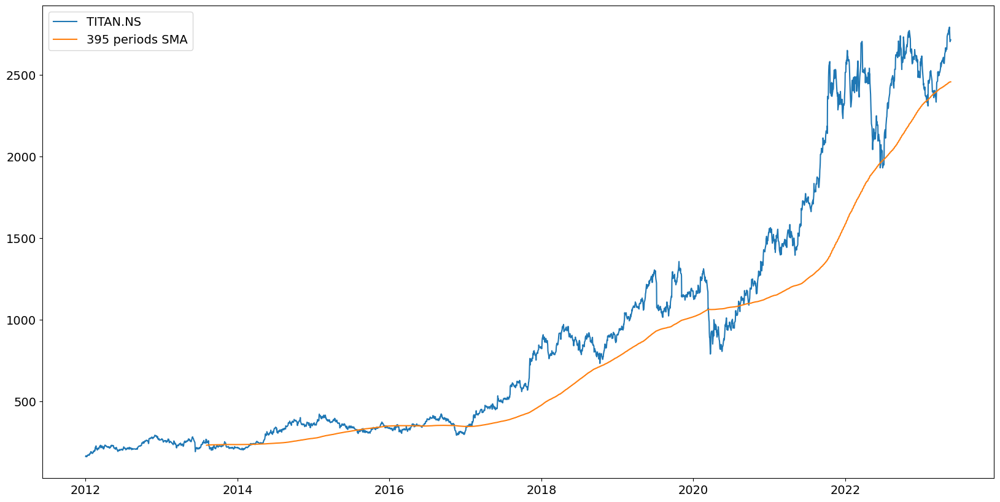

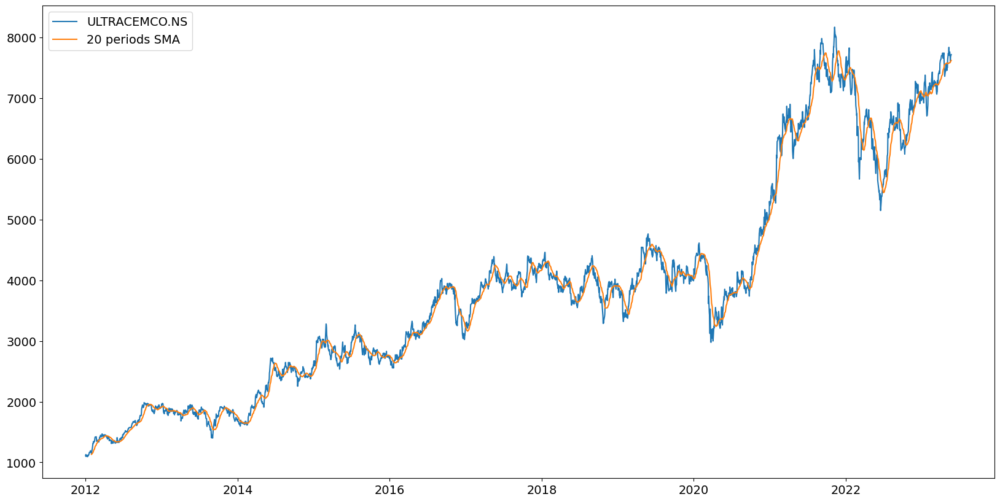

In [ ]:
best_sma_arr = []
up_arr=[]
for i in range(length):
  ticker = yfinance.Ticker(name[i])
  data = ticker.history(interval="1d",start=start_date,end=end_date)

  data['Forward Close'] = data['Close'].shift(-n_forward)

  data['Forward Return'] = (data['Forward Close'] - data['Close'])/data['Close']


  result = []
  train_size = 0.6

  for sma_length in range(20,500):

    data['SMA'] = data['Close'].rolling(sma_length).mean()
    data['input'] = [int(x) for x in data['Close'] > data['SMA']]

    df = data.dropna()

    training = df.head(int(train_size * df.shape[0]))
    test = df.tail(int((1 - train_size) * df.shape[0]))

    tr_returns = training[training['input'] == 1]['Forward Return']
    test_returns = test[test['input'] == 1]['Forward Return']

    mean_forward_return_training = tr_returns.mean()
    mean_forward_return_test = test_returns.mean()

    pvalue = ttest_ind(tr_returns,test_returns,equal_var=False)[1]

    result.append({
      'sma_length':sma_length,
      'training_forward_return': mean_forward_return_training,
      'test_forward_return': mean_forward_return_test,
      'p-value':pvalue
    })
  result.sort(key = lambda x : -x['training_forward_return'])
  best_sma = result[0]['sma_length']
  data['SMA'] = data['Close'].rolling(best_sma).mean()
  SMA=best_sma
  if data['Close'][-1] > data['SMA'][-1]:
   up_arr.append("1")
   #plotting
   plt.plot(data['Close'],label=name[i])
   plt.plot(data['SMA'],label = "{} periods SMA".format(best_sma))
   plt.legend()
   plt.show()

  else :
   up_arr.append("0")
  best_sma_arr.append(best_sma)


In [ ]:
count=0
name_final= []
for i in up_arr:
  if i =='1':
    count+=1
    name_final.append(name[count])
print(count)

39


In [ ]:
print(name_final)

['ADANIPORTS.NS', 'APOLLOHOSP.NS', 'ASIANPAINT.NS', 'AXISBANK.NS', 'BAJAJ-AUTO.NS', 'BAJAJFINSV.NS', 'BAJFINANCE.NS', 'BHARTIARTL.NS', 'BPCL.NS', 'BRITANNIA.NS', 'CIPLA.NS', 'COALINDIA.NS', 'DIVISLAB.NS', 'DRREDDY.NS', 'EICHERMOT.NS', 'GRASIM.NS', 'HCLTECH.NS', 'HDFC.NS', 'HDFCBANK.NS', 'HDFCLIFE.NS', 'HEROMOTOCO.NS', 'HINDALCO.NS', 'HINDUNILVR.NS', 'ICICIBANK.NS', 'INDUSINDBK.NS', 'INFY.NS', 'ITC.NS', 'JSWSTEEL.NS', 'KOTAKBANK.NS', 'LT.NS', 'M&M.NS', 'MARUTI.NS', 'NESTLEIND.NS', 'NTPC.NS', 'ONGC.NS', 'POWERGRID.NS', 'RELIANCE.NS', 'SBILIFE.NS', 'SBIN.NS']


In [ ]:
len(name_final)

39

In [ ]:
print(best_sma_arr)
print(len(best_sma_arr))

[386, 129, 448, 499, 117, 35, 369, 395, 299, 389, 87, 59, 142, 46, 285, 116, 332, 164, 485, 396, 24, 222, 158, 38, 497, 499, 317, 81, 299, 499, 41, 40, 422, 499, 23, 98, 107, 499, 387, 145, 242, 109, 201, 150, 228, 334, 395, 20, 359, 351]
50


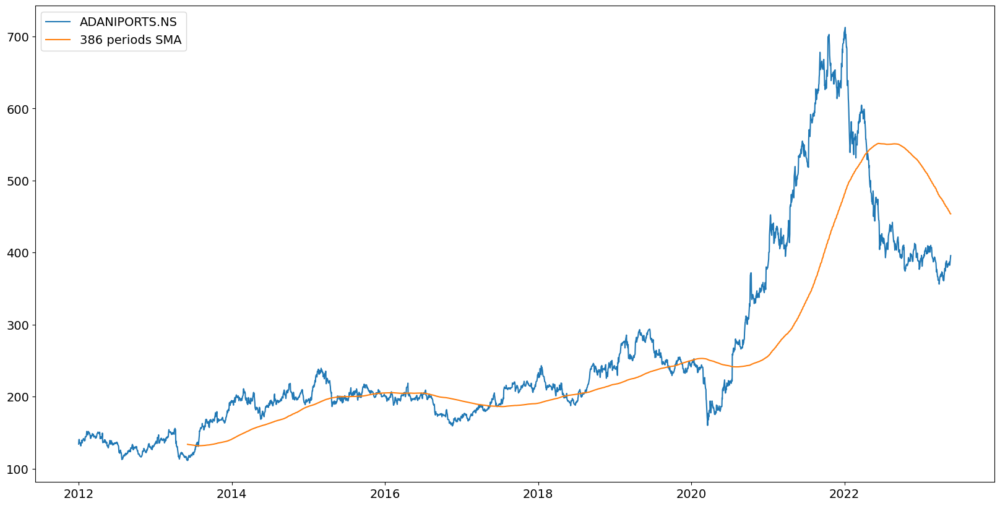

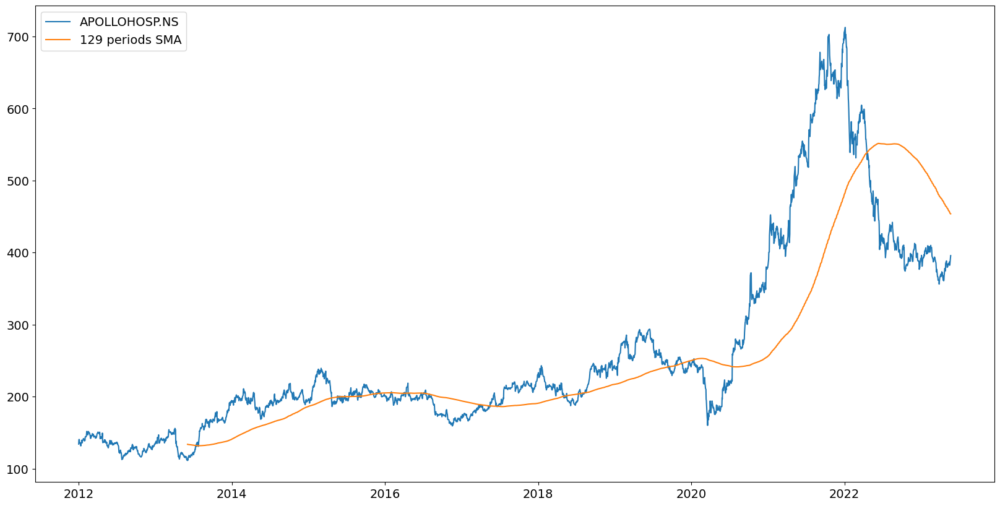

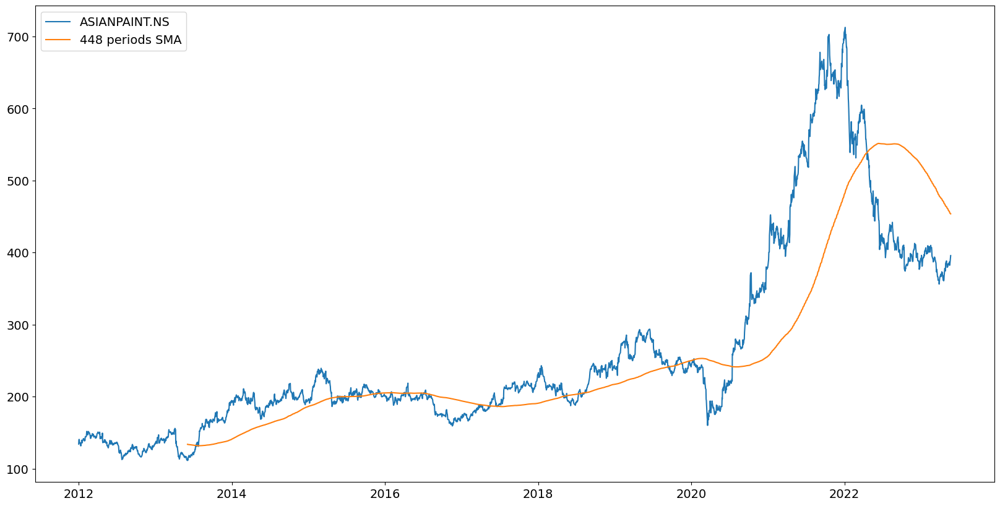

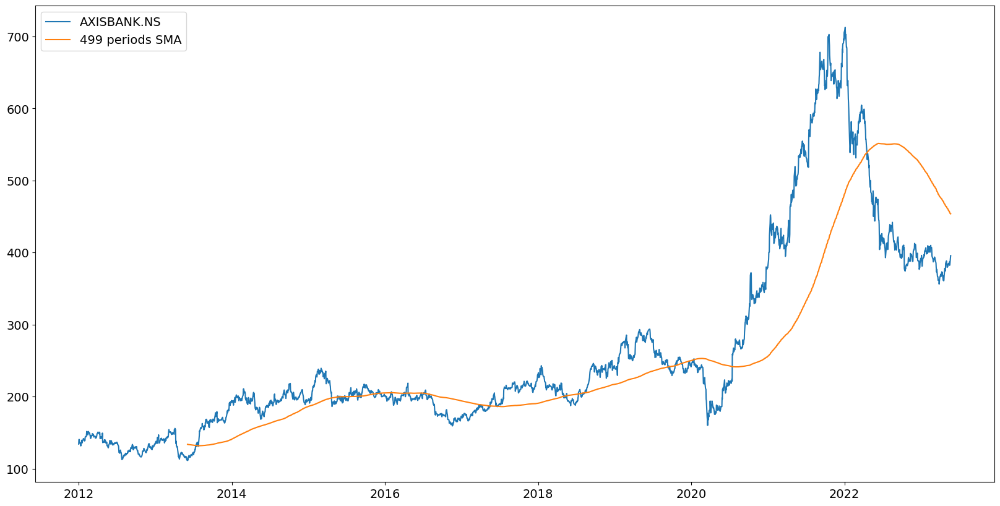

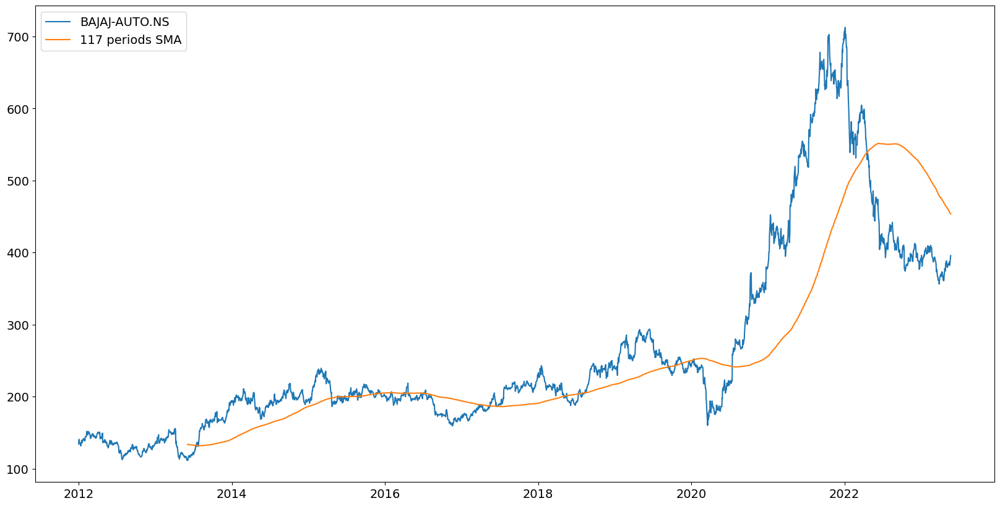

...

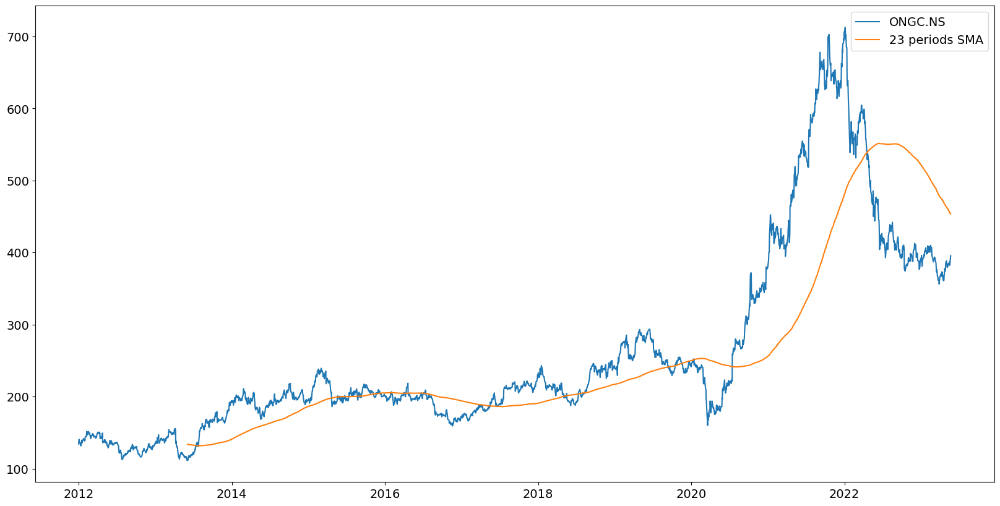

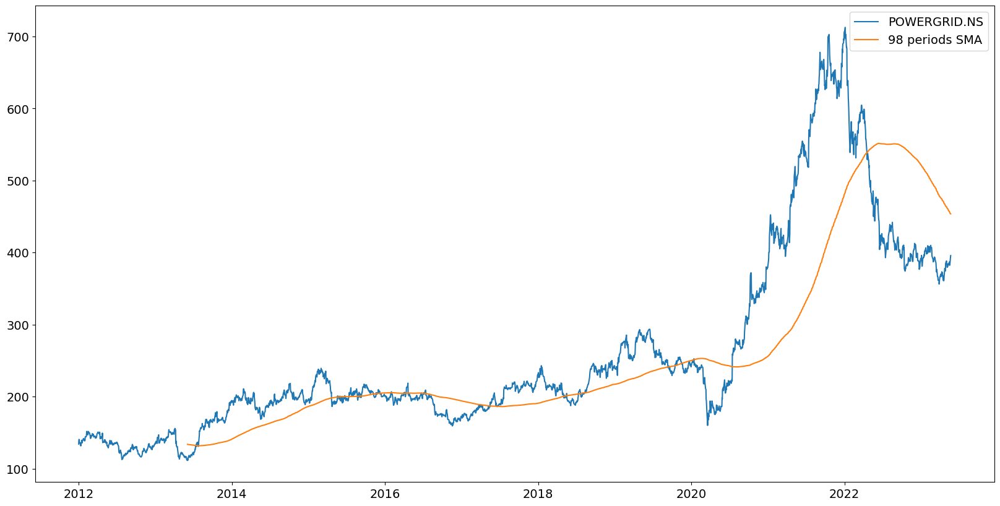

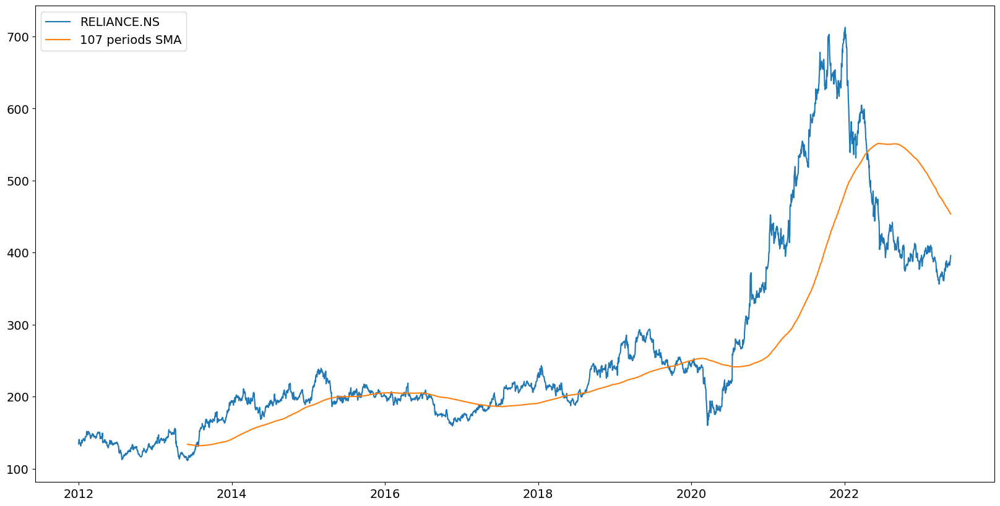

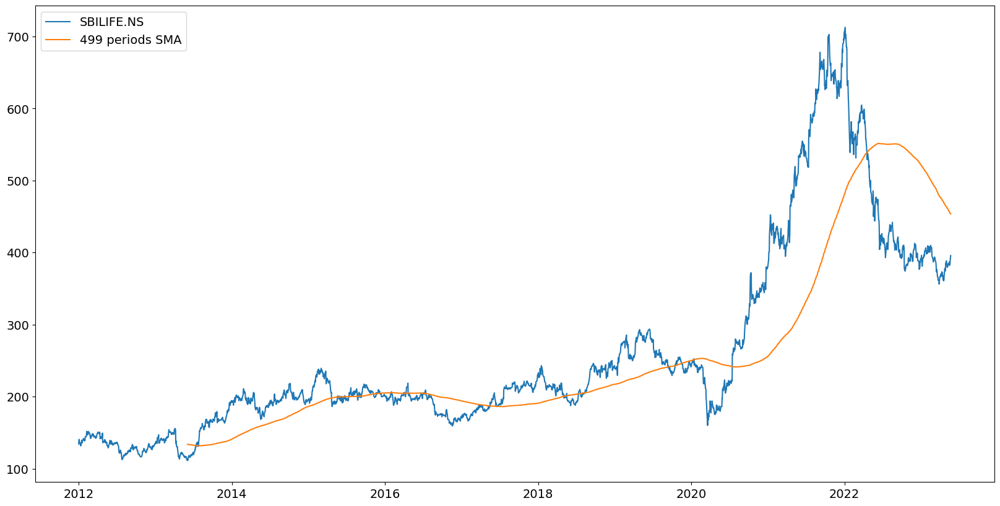

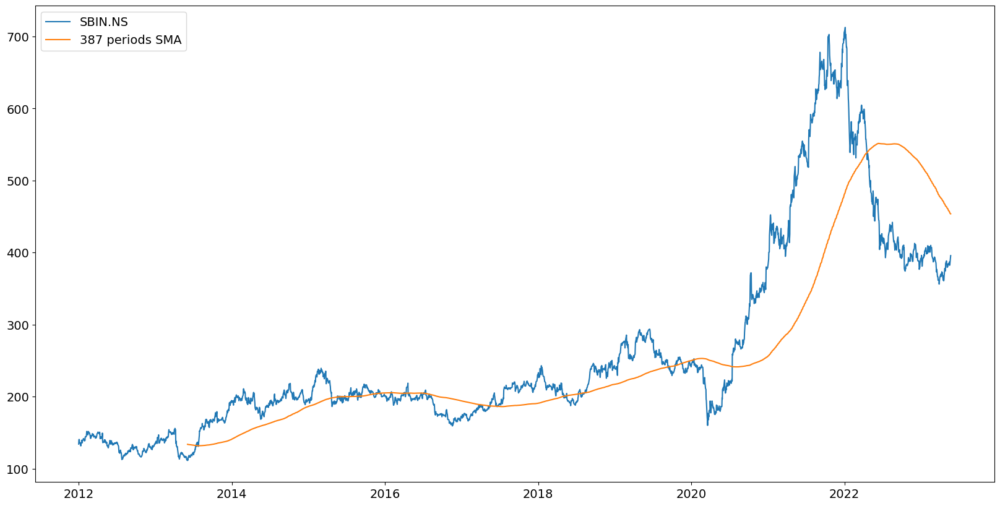

In [ ]:
j=0
for i in name_final:

  plt.plot(data['Close'],label=i)
  plt.plot(data['SMA'],label = "{} periods SMA".format(best_sma_arr[j]))
  j+=1
  plt.legend()
  plt.show()